# Import Libraries

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
pd.options.plotting.backend = "plotly"
import plotly.express as px
import matplotlib.pyplot as plt

In [ ]:
pip install -U ydata-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.9/345.9 KB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 26.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 KB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 42.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 KB 4.0 MB/s eta 0:00:00
  Attempting uninstall: tqdm
    Found existing installation: tqdm 4.65.0
    Uninstalling tqdm-4.65.0:
      Successfully uninstalled tqdm-4.65.0
  Attempting uninstall: scipy
    Found existing installation: scipy 1.10.1
    Uninstalling scipy-1.10.1:
      Successfully uninstalled scipy-1.10.1
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:
      Successfully uninstalled matplotlib-3.7.1
  Attempting uninstall: visions

In [ ]:
from ydata_profiling import ProfileReport
from IPython.display import HTML

In [ ]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.metrics import silhouette_samples, silhouette_score, homogeneity_completeness_v_measure

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [ ]:
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram, linkage

In [ ]:
import itertools

# Load Data

In [ ]:
df = pd.read_csv('DATA624_Assignment4_Data.csv')
df

,0,1,2,3,4,5,6,7,8,9,0.1,1.1,2.1,3.1,4.1
0,-1.606951,0.873530,0.354386,-0.376583,-0.123913,-5.574885,0.115763,6.322857,-0.133692,-0.235926,0.849269,0.972069,-0.785170,0,0
1,0.704287,-1.828743,-0.116858,0.147165,-0.296007,-5.944087,-0.156580,5.940719,0.056806,-0.048602,-0.441113,0.368587,-1.788952,0,0
2,1.424599,-0.281860,0.841544,-0.655310,0.378469,-6.604756,-0.426063,6.230854,-0.091393,0.036048,-1.214484,1.536237,-1.044251,0,0
3,1.390018,0.289805,1.093028,-0.690624,-0.548168,-5.948213,-0.081209,6.015520,0.032229,0.033835,-0.943463,1.642818,-0.378879,0,1
4,1.032563,-1.042404,1.019796,0.888428,-0.102096,-5.970099,-0.071962,6.030498,-0.015960,0.015448,-0.349584,0.828618,0.716666,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6165,-3.907976,2.522889,-2.677499,1.191893,-1.437921,-1.749991,-0.189743,-2.224573,0.632479,-0.395722,0.863990,-1.796155,-0.666441,0,0
6166,3.330155,-4.534200,1.625227,-0.485558,0.914868,-0.527034,-0.507081,-2.210805,0.161828,0.177358,-0.011854,0.829740,-1.415080,0,0
6167,-3.300942,-2.333507,-1.022910,-2.212949,2.440453,2.567430,-0.558333,-2.353216,0.844371,-0.134437,1.186000,0.377601,-0.645886,0,0
6168,5.778613,0.536104,0.906734,-0.986751,-0.447457,-0.161881,-0.292931,-1.543889,0.006976,-0.063753,2.320993,-0.314321,2.069582,0,0


# Exploratory Analysis

In [ ]:
# Printed basic information and statistics about `df`
print(df.info())
print(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6170 entries, 0 to 6169
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       6170 non-null   float64
 1   1       6170 non-null   float64
 2   2       6170 non-null   float64
 3   3       6170 non-null   float64
 4   4       6170 non-null   float64
 5   5       6170 non-null   float64
 6   6       6170 non-null   float64
 7   7       6170 non-null   float64
 8   8       6170 non-null   float64
 9   9       6170 non-null   float64
 10  0.1     6170 non-null   float64
 11  1.1     6170 non-null   float64
 12  2.1     6170 non-null   float64
 13  3.1     6170 non-null   int64  
 14  4.1     6170 non-null   int64  
dtypes: float64(13), int64(2)
memory usage: 723.2 KB
None
                 0            1            2            3            4  \
count  6170.000000  6170.000000  6170.000000  6170.000000  6170.000000   
mean      0.032403     0.041632     0.006366     0.006691 

From printing basic information about `df`, we can see that the dataframe consists of 6170 rows and 14 columns. There are no missing values in any of the columns. We can also see that the first 12 columns (i.e., columns 0 to 12) are floats whereas the last two columns (i.e., columns 13 and 14) are integers. The mean, standard deviation and the quartile values (i.e., min, 25%, 50%, 75%, max) of each variable are also displayed. From these, we could see that the scales of the float columns were approximately similar. 

In [ ]:
# Generated a profile report for `df` using the `ProfileReport` class from the `ydata_profiling` module
profile = ProfileReport(
    df, 
    title="Nifty Profiling Report",
    # dark_mode=True,
    orange_mode=True,
    minimal=True,
)

## Displayed the profile report
display(HTML(profile.to_html()))

# ## Saved the profile report to a HTML report
# profile.to_file("nifty_profiling_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Number of variables,15
Number of observations,6170
Missing cells,0
Missing cells (%),0.0%
Total size in memory,723.2 KiB
Average record size in memory,120.0 B
Numeric,15
"3.1 has constant value """"",Constant
0 has unique values,Unique
1 has unique values,Unique
2 has unique values,Unique


Though I experimented with using Google Facets Overview, Google Facets Dive and seaborn histograms to explore how the variables looked individually, I found that using the `ProfileReport` class from the `ydata_profiling` module allowed me to generate the most comprehensive, easy-to-follow summary of the characteristics of each variable. 

The generated Nifty Report (displayed above) contains detailed information and statistics about the data alongside a histogram displaying the distribution of each variable. Using the histogram for each column alongside our knowledge of the standard deviation of each column from earlier, we can see that all the float columns (i.e., columns from 0 to 12) except for columns 0, 5, 6, 7, 8 and 9 appear approximately normally distributed. Compared with the columns I considered to have 'approximately normal' distributions, columns 0 and 7 have relatively greater standard deviations (i.e., 2.509250 and 3.248121 respsectively). I considered the distributions for columns 6, 8 and 9 non-normal because they have much steeper domes compared to the column distributions I considered approximately normal. Finally, I considered columns 5 and 7 non-normally distributed because column 5 had a multimodal distribution with three peaks while column 7 had a bimodal distribution. 

The Nifty Report also revealed that the values in column 13 (named 3.1 in `df`) were all '0' while all the values in column 14 (named 4.1 in `df`) were '0' or '1'. We can also see that column 14 had more '0' values than '1' values. 

Because column 13 consists only of 0s and column 14 consists only of 0s or 1s, they are not well-suited for clustering algorithms designed for continuous variables. As such, for the rest of my analysis (including my clustering analysis), I decided to exclude the last two columns (i.e., the integer columns) of `df`.

In [ ]:
# Removed the last two columns of `df`
df = df.drop(['3.1', '4.1'], axis=1)

In [ ]:
# Plotted pairwise relationships of `df`
sns.pairplot(df)
plt.title('Pairwise Relationships')
plt.show()

KeyboardInterrupt: ignored

In [ ]:
# Generated a heatmap the correlation matrix among the columns in `df`
corr_matrix = df.corr()
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

From the pairplot and correlation matrix (displayed above), I wanted see whether there appeared to be relationships between pairs of variables and if so, what those relationships look like. Notably, there did not appear to be any moderate or strong linear correlations (neither positive nor negative) between any pairs of variables. According to the correlation matrix, the strongest linear relationship was the negative association (-0.31) between columns 6 and 9. 

# Clustering Analysis

## KMeans

### Deciding on the number of clusters...

#### ...using the elbow method

First, I used the elbow method to (visually) decide on the number of clusters that I want to identify in my data. I used the **yellowbrick** package to generate my elbow plot (as  recommended by Rink (2022)). 

In [ ]:
fig, ax = plt.subplots()

visualizer = KElbowVisualizer(KMeans(), k=(1,10),ax=ax)
visualizer.fit(df)

ax.set_xticks(range(1,10))
visualizer.show()
plt.show()

From the elbow plot above, we can see that the the slope of the line appears to level off when k = 3. As such, we can infer from the elbow method plot that the optimal number of clusters is 3. 

#### ...using the silhouette method

I then used the silhouette method to confirm my conclusion from the elbow method (i.e., that k = 3 is the optimal number of clusters). 

In [ ]:
sscore = []
for i in range(2,10):
    kmeans = KMeans(
        n_clusters = i, 
        init = "k-means++", 
        max_iter= 100, 
        tol=0.0001,
    ).fit(
        df
    )
    
    silhouette_avg = silhouette_score(df, kmeans.labels_)
    sscore.append(silhouette_avg)
    
px.line(y = sscore,x = range(2,10), markers=True,
        labels={'y': "Silhouette Score",
                'x': "Number of Clusters"})

From the silhouette score plot method plot above, we can see that highest silhouette score is for when k = 4. As such, we can infer from the silhouette score method plot that the optimal number of clusters is k = 4. This conflicts with the findings from the elbow score method plot where we inferred that the optimal number of clusters was k = 3. 

#### ... using the silhouette analysis method

In [ ]:
# Performed comparative analysis to determine the optimal cluster number using silhouette plots and silhouette scores

fig, ax = plt.subplots(1, 2, figsize=(15,8))

for i in [3,4]:

    ## Created KMeans instance for different number of clusters
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)

    ## Created SilhouetteVisualizer instance with KMeans instance and fitted the visualizer
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[i-3])
    visualizer.fit(df)

    ## Calculated and displayed silhouette score
    score = silhouette_score(df, km.labels_)
    visualizer.ax.set_title(f"Silhouette Score: {score:.2f}")

Both charts showed the presence of clusters with below average silhouette scores (as indicated by the dotted red line on the charts) as well as fluctuations in the thickness of the bars in each chart. That said, from the charts, it is evident that the average silhouette score of the silhouette bar chart with 4 clusters is higher than the average silhouette score of the silhouette bar chart with 3 clusters. This suggests that 4 clusters is more optimal than 3 clusters. 

### Visualizing the clusters...

Given that the elbow score method plot revealed that the optimal number of clusters was k = 3 while the silhouette score plot method and the silhouette analysis method revealed that the optimal number of clusters was k = 4, I decided to visualize the clusters when k = 3 and when k = 4. 

#### ... using 3 clusters

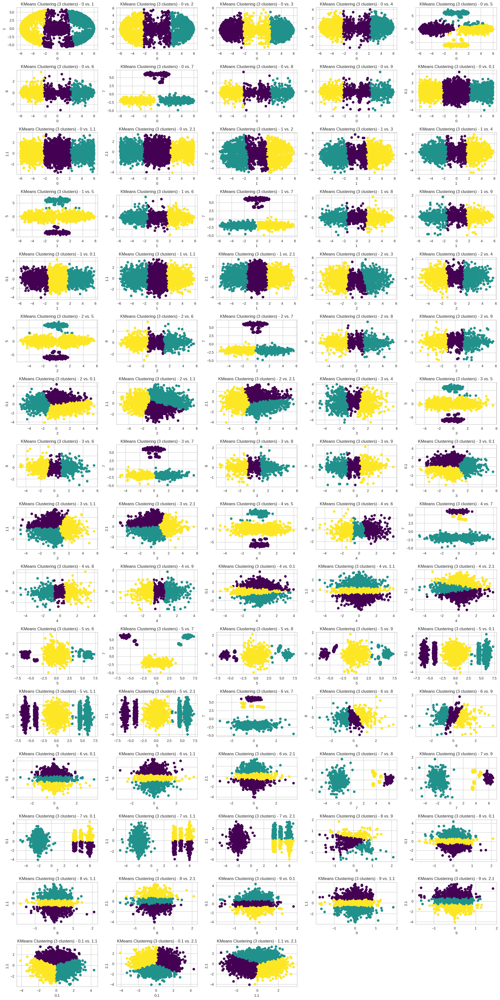

In [ ]:
# Generated all possible combinations of column pairs
column_pairs = itertools.combinations(df.columns, 2)

# Define the number of rows and columns for the subplot matrix
nrows = 16
ncols = 5

# Created a figure and subplots with the defined number of rows and columns
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 40))

# Reshaped the axis array to a flat array for easy indexing
ax = ax.flatten()

# Initialized list to store silhouette scores
silhouette_scores_k3 = []

# Looped over each column pair and plot the KMeans clustering results
for i, pair in enumerate(column_pairs):
    # Extract the two columns for this pair
    col1, col2 = pair
    data = df[[col1, col2]]
    
    # Performed KMeans clustering with 4 clusters
    kmeans_3 = KMeans(n_clusters=3, init='k-means++', max_iter=100, random_state=42)
    kmeans_3.fit(data)
    labels_k3 = kmeans_3.labels_

    # Calculated silhouette score and add to list of scores
    score_k3 = silhouette_score(data, labels_k3)
    silhouette_scores_k3.append(score_k3)
    
    # Visualized the clustering results on the subplot matrix
    ax[i].scatter(data[col1], data[col2], c=labels_k3, cmap='viridis')
    ax[i].set_xlabel(col1)
    ax[i].set_ylabel(col2)
    ax[i].set_title(f'KMeans Clustering (3 clusters) - {col1} vs. {col2}')

# Calculated average silhouette score
avg_silhouette_score_kmeans3 = sum(silhouette_scores_k3) / len(silhouette_scores_k3)

# Removed any extra subplots from the subplot matrix
for j in range(i+1, nrows*ncols):
    fig.delaxes(ax[j])

# Adjusted the spacing between the subplots and show the figure
fig.tight_layout()
plt.show()

In [ ]:
# Printed average silhouette score
print(avg_silhouette_score_kmeans3)

0.6084969785503694


#### ... using 4 clusters

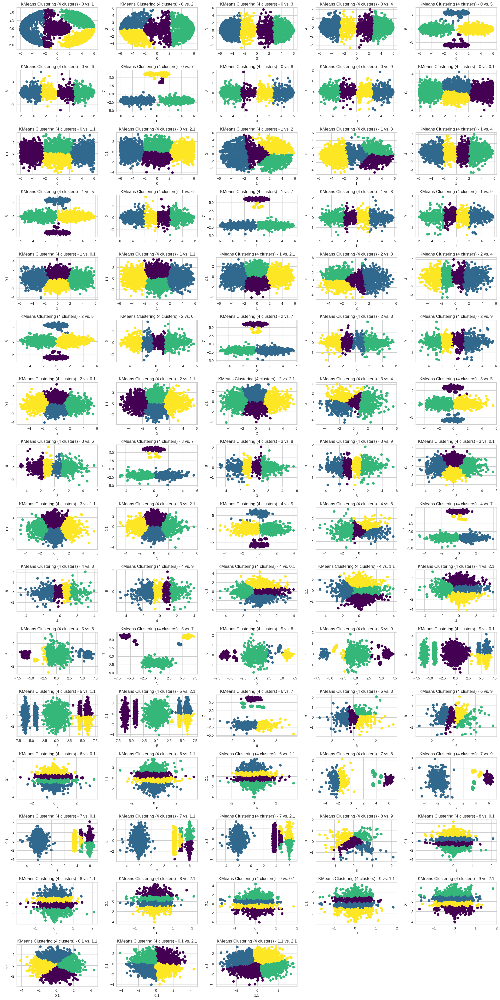

In [ ]:
# Generated all possible combinations of column pairs
column_pairs = itertools.combinations(df.columns, 2)

# Defined the number of rows and columns for the subplot matrix
nrows = 16
ncols = 5

# Created a figure and subplots with the defined number of rows and columns
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 40))

# Reshaped the axis array to a flat array for easy indexing
ax = ax.flatten()

# Initialized list to store silhouette scores
silhouette_scores_k4 = []

# Looped over each column pair and plot the KMeans clustering results
for i, pair in enumerate(column_pairs):
    # Extracted the two columns for this pair
    col1, col2 = pair
    data = df[[col1, col2]]
    
    # Performed KMeans clustering with 4 clusters
    kmeans_4 = KMeans(n_clusters=4, init='k-means++', max_iter=100, random_state=42)
    kmeans_4.fit(data)
    labels_k4 = kmeans_4.labels_

    # Calculated silhouette score and add to list of scores
    score_k4 = silhouette_score(data, labels_k4)
    silhouette_scores_k4.append(score_k4)
    
    # Visualized the clustering results on the subplot matrix
    ax[i].scatter(data[col1], data[col2], c=labels_k4, cmap='viridis')
    ax[i].set_xlabel(col1)
    ax[i].set_ylabel(col2)
    ax[i].set_title(f'KMeans Clustering (4 clusters) - {col1} vs. {col2}')

# Calculated average silhouette score
avg_silhouette_score_kmeans4 = sum(silhouette_scores_k4) / len(silhouette_scores_k4)

# Removed any extra subplots from the subplot matrix
for j in range(i+1, nrows*ncols):
    fig.delaxes(ax[j])

# Adjusted the spacing between the subplots and show the figure
fig.tight_layout()
plt.show()

In [ ]:
# Printed average silhouette score
print(avg_silhouette_score_kmeans4)

0.5514489925583254


## Agglomerative Clustering

### Deciding on the number of clusters using the dendrogram method

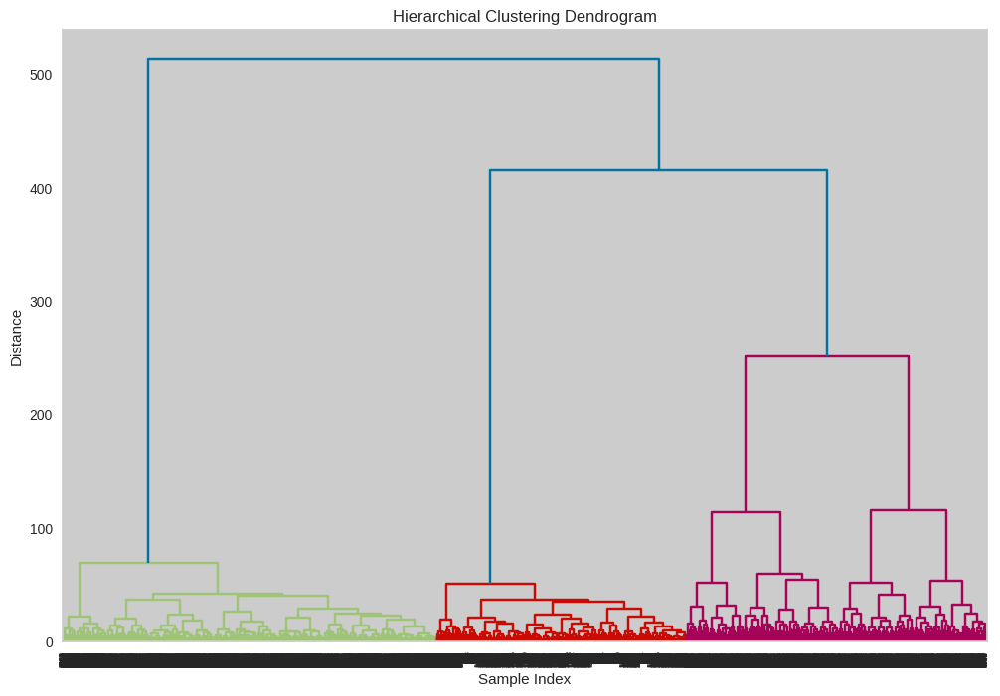

In [ ]:
# Plotted the dendrogram
plt.figure(figsize=(12, 8))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dend = shc.dendrogram(shc.linkage(df,method='ward'))

In [ ]:
# Printed the optimal number of clusters based on the dendrogram
unique_colours = set(dend['color_list'])
optimal_number_of_clusters_agg = len(unique_colours) - 1
print(optimal_number_of_clusters_agg)

3


From the dendrogram, it is clear that the optimal number of clusters is 3 (with each cluster being displayed in a different colour). 

### Visualizing the clusters

In [ ]:
# Created AgglomerativeClustering instance with 3 clusters and fit the model to the data
agg = AgglomerativeClustering(n_clusters=3)
agg_labels = agg.fit_predict(df)

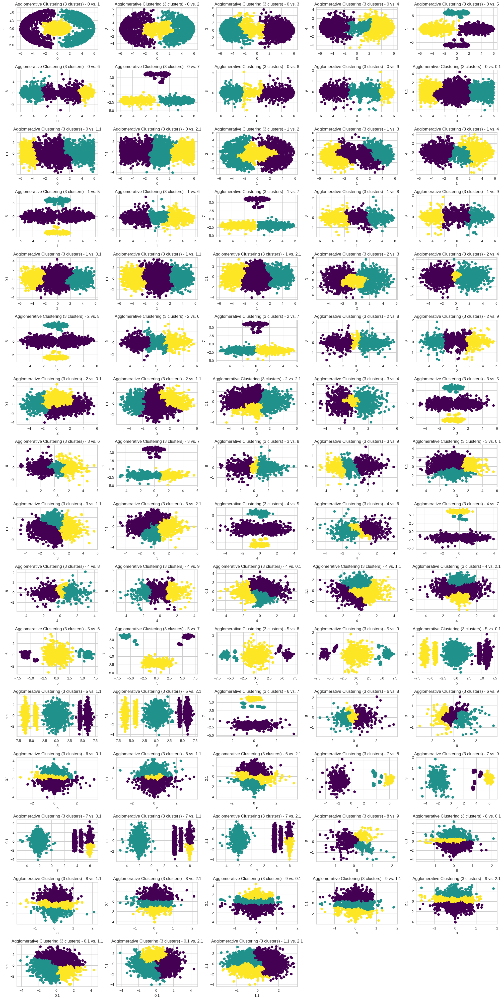

In [ ]:
# Generated all possible combinations of column pairs
column_pairs = itertools.combinations(df.columns, 2)

# Defined the number of rows and columns for the subplot matrix
nrows = 16
ncols = 5

# Created a figure and subplots with the defined number of rows and columns
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 40))

# Reshaped the axis array to a flat array for easy indexing
ax = ax.flatten()

# Initialized list to store silhouette scores
silhouette_scores_agg = []

# Looped over each column pair and plot the agglomerative clustering results
for i, pair in enumerate(column_pairs):
    # Extracted the two columns for this pair
    col1, col2 = pair
    data = df[[col1, col2]]
    
    # Performed agglomerative clustering with 3 clusters
    agg_3 = AgglomerativeClustering(n_clusters=3)
    agg_3.fit(data)
    labels_agg = agg_3.labels_

    # Calculated silhouette score and add to list of scores
    score_agg = silhouette_score(data, labels_agg)
    silhouette_scores_agg.append(score_agg)
    
    # Visualized the clustering results on the subplot matrix
    ax[i].scatter(data[col1], data[col2], c=labels_agg, cmap='viridis')
    ax[i].set_xlabel(col1)
    ax[i].set_ylabel(col2)
    ax[i].set_title(f'Agglomerative Clustering (3 clusters) - {col1} vs. {col2}')

# Calculated average silhouette score
avg_silhouette_score_agg = sum(silhouette_scores_agg) / len(silhouette_scores_agg)

# Removed any extra subplots from the subplot matrix
for j in range(i+1, nrows*ncols):
    fig.delaxes(ax[j])

# Adjusted the spacing between the subplots and show the figure
fig.tight_layout()
plt.show()

In [ ]:
# Printed average silhouette score
print(avg_silhouette_score_agg)

0.5836076278011737


## DBSCAN

In using DBSCAN, I chose the range of hyperparameters to search based on trial and error. 

In [ ]:
# Defined the range of hyperparameters to search
eps_values = [2, 3, 4, 5, 6, 7, 8, 9, 10]
min_samples_values = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

# Looped over all hyperparameter combinations and calculate silhouette score
best_score = -1
best_eps = None
best_min_samples = None
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(df)
        if len(set(labels)) > 1:
            score = silhouette_score(df, labels)
            if score > best_score:
                best_score = score
                best_eps = eps
                best_min_samples = min_samples

print("Best eps:", best_eps)
print("Best min_samples:", best_min_samples)

# Fit DBSCAN with the best hyperparameters on the original dataset
best_dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_dbscan_labels = best_dbscan.fit_predict(df)

Best eps: 6
Best min_samples: 1


In [ ]:
# Computed and displayed silhouette score
silhouette_dbscan = silhouette_score(df, best_dbscan_labels)
print("Silhouette score:", silhouette_dbscan)

# Counted and displayed the number of data points in each cluster
unique_labels, counts = np.unique(best_dbscan_labels, return_counts=True)
for label, count in zip(unique_labels, counts):
    print(f"Cluster {label}: {count} data points")

Silhouette score: 0.5811441145798464
Cluster 0: 1670 data points
Cluster 1: 2500 data points
Cluster 2: 2000 data points


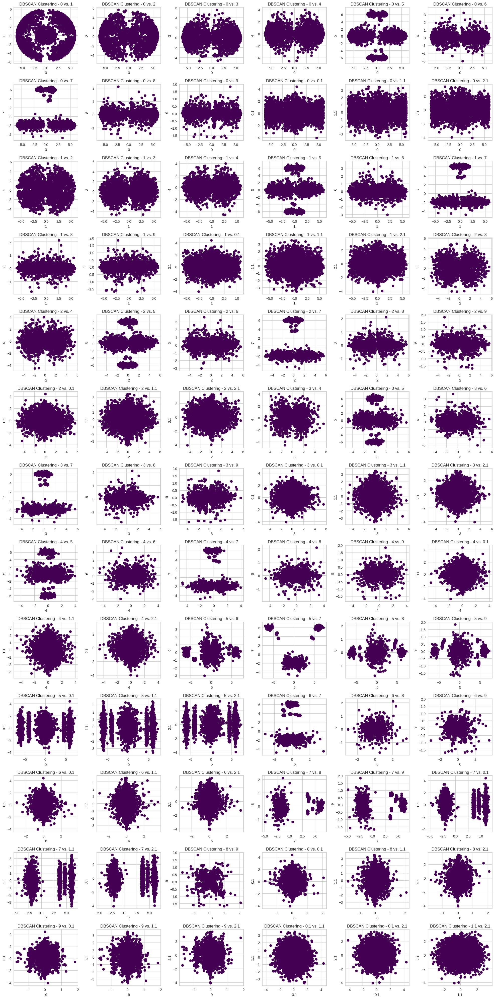

In [ ]:
# Generated all possible combinations of column pairs
column_pairs = itertools.combinations(df.columns, 2)

# Performed DBSCAN clustering on each pair of columns and visualize the results
fig, axes = plt.subplots(13, 6, figsize=(20, 40))
axes = axes.flatten()
for i, pair in enumerate(column_pairs):
    # Extracted the two columns for this pair
    col1, col2 = pair
    data = df[[col1, col2]]
    
    # Performed DBSCAN clustering with eps=best_eps and min_samples=best_min_samples
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
    labels = dbscan.fit_predict(data)
    
    # Get the number of clusters and create a custom color map
    n_clusters = len(set(labels))
    
    # Visualize the clustering results
    axes[i].scatter(data[col1], data[col2], c=labels, cmap='viridis')
    axes[i].set_xlabel(col1)
    axes[i].set_ylabel(col2)
    axes[i].set_title(f'DBSCAN Clustering - {col1} vs. {col2}')
    
# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')
    
plt.tight_layout()
plt.show()

# Comparing the Clustering Results

Based on a visual inspection of the three clustering results from kmeans and/or agglomerative clustering, none of them appeared to have very well-separated clusters. Further, there was a wide range of cluster sizes for all of the clustering results using kmeans and agglomerative clustering. These observations may suggest that neither of the chosen algorithms were best-suited to the data. 

Unfortunately, due to time constraints, I was unable to get my DBSCAN visualizations to display the clusters as different colour so I could not inspect the plots individually. 

That said, when comparing the silhouette scores of all the clustering results, we found that using k-means clustering with three clusters resulted in the silhouette score closest to 1. This would suggest that using k-means clustering with three clusters yielded a better clustering result than both k-means clustering with four clusters, agglomerative clustering with three clusters and the DBSCAN with eps = 6, min_samples = 1. 

As such, I opted to use k-means clustering with three clusters to find outliers and when generate the one column CSV. 

# Finding and Visualizing Outliers

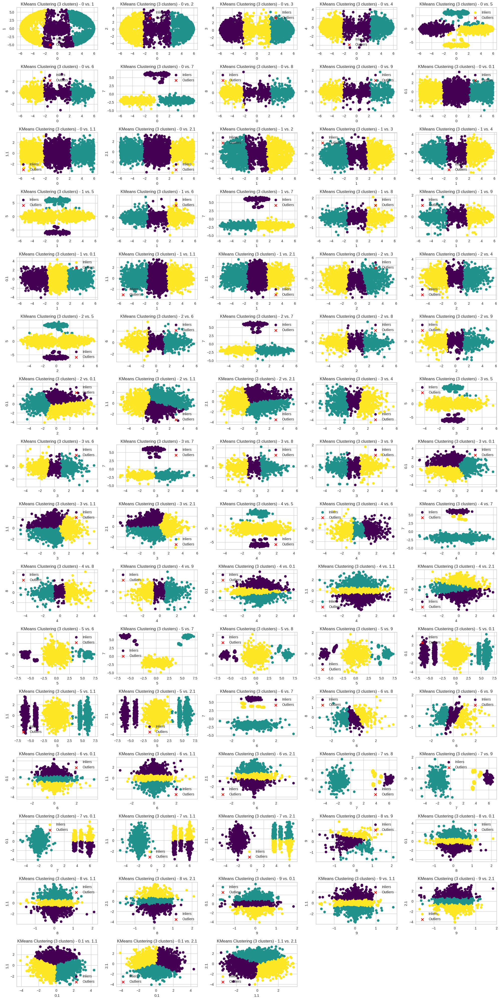

In [ ]:
# Generated all possible combinations of column pairs
column_pairs = itertools.combinations(df.columns, 2)

# Define the number of rows and columns for the subplot matrix
nrows = 16
ncols = 5

# Created a figure and subplots with the defined number of rows and columns
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 40))

# Reshaped the axis array to a flat array for easy indexing
ax = ax.flatten()

# Initialized list to store silhouette scores
silhouette_scores_k3 = []

# Looped over each column pair and plot the KMeans clustering results
for i, pair in enumerate(column_pairs):
    # Extract the two columns for this pair
    col1, col2 = pair
    data = df[[col1, col2]]
    
    # Performed KMeans clustering with 3 clusters
    kmeans_3 = KMeans(n_clusters=3, init='k-means++', max_iter=100, random_state=42)
    kmeans_3.fit(data)
    labels_k3 = kmeans_3.labels_

    # Calculated silhouette score and add to list of scores
    score_k3 = silhouette_score(data, labels_k3)
    silhouette_scores_k3.append(score_k3)
    
    # Visualized the clustering results on the subplot matrix
    ax[i].scatter(data[labels_k3!=-1][col1], data[labels_k3!=-1][col2], c=labels_k3[labels_k3!=-1], cmap='viridis', marker='o', label='Inliers')
    ax[i].scatter(data[labels_k3==-1][col1], data[labels_k3==-1][col2], c='red', marker='x', label='Outliers')
    ax[i].set_xlabel(col1)
    ax[i].set_ylabel(col2)
    ax[i].set_title(f'KMeans Clustering (3 clusters) - {col1} vs. {col2}')
    ax[i].legend()

# Calculated average silhouette score
avg_silhouette_score_kmeans3 = sum(silhouette_scores_k3) / len(silhouette_scores_k3)

# Removed any extra subplots from the subplot matrix
for j in range(i+1, nrows*ncols):
    fig.delaxes(ax[j])

# Adjusted the spacing between the subplots and show the figure
fig.tight_layout()
plt.show()


# Generating one column CSV



In [ ]:
# Determined the number of clusters and outlier label
num_clusters = len(set(labels_k3)) - (1 if -1 in labels_k3 else 0)
outlier_label = np.max(labels_k3) + 1

# Assigned outliers to their own cluster
labels_k3[labels_k3 == -1] = outlier_label

# Saved the cluster labels to a one column CSV file
cluster_labels = pd.DataFrame(labels_k3, columns=['cluster'])
cluster_labels.to_csv('cluster_labels.csv', index=False)

In [ ]:
# Counted the number of entries in each cluster label
counts = cluster_labels['cluster'].value_counts()

# Created a dataframe with cluster label and numbered of entries columns
cluster_counts = pd.DataFrame({'cluster': counts.index, 'count': counts.values})

# Sorted the dataframe by cluster label
cluster_counts = cluster_counts.sort_values(by=['cluster']).reset_index(drop=True)

# Printed the dataframe
print(cluster_counts)

   cluster  count
0        0   2156
1        1   2122
2        2   1892


# Archive

In [ ]:
# Generated all possible combinations of column pairs
column_pairs = itertools.combinations(df.columns, 2)

# Performed k-means clustering on each pair of columns and visualize the results
for pair in column_pairs:
    # Extracted the two columns for this pair
    col1, col2 = pair
    data = df[[col1, col2]]
    
    # Performed k-means clustering with 3 clusters
    kmeans_3 = KMeans(n_clusters=3, init='k-means++', max_iter=100, random_state=42)
    kmeans_3.fit(data)
    labels = kmeans_3.labels_
    
    # Visualized the clustering results
    plt.scatter(data[col1], data[col2], c=labels, cmap='viridis')
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.title(f'KMeans Clustering (3 clusters) - {col1} vs. {col2}')
    plt.show()

In [ ]:
# Generated all possible combinations of column pairs
column_pairs = itertools.combinations(df.columns, 2)

# Performed k-means clustering on each pair of columns and visualize the results
for pair in column_pairs:
    # Extracted the two columns for this pair
    col1, col2 = pair
    data = df[[col1, col2]]
    
    # Performed k-means clustering with 4 clusters
    kmeans_4 = KMeans(n_clusters=4, init='k-means++', max_iter=100, random_state=42)
    kmeans_4.fit(data)
    labels = kmeans_4.labels_
    
    # Visualized the clustering results
    plt.scatter(data[col1], data[col2], c=labels, cmap='viridis')
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.title(f'KMeans Clustering (4 clusters) - {col1} vs. {col2}')
    plt.show()

In [ ]:
# Generated all possible combinations of column pairs
column_pairs = itertools.combinations(df.columns, 2)

# Performed agglomerative clustering on each pair of columns and visualize the results
for pair in column_pairs:
    # Extracted the two columns for this pair
    col1, col2 = pair
    data = df[[col1, col2]]
    
    # Performed agglomerative clustering with 3 clusters
    agglomerative_3 = AgglomerativeClustering(n_clusters=3, linkage='ward')
    labels = agglomerative_3.fit_predict(data)
    
    # Visualized the clustering results
    plt.scatter(data[col1], data[col2], c=labels, cmap='viridis')
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.title(f'Agglomerative Clustering (3 clusters) - {col1} vs. {col2}')
    plt.show()

Based on a visual inspection of the three clustering results above, none of them appeared to have very well-separated clusters. Further, there was a wide range of cluster sizes for all three of the clustering results. These observations may suggest that none of the chosen algorithms were best-suited to the data. That said, due to time constraints, I was unable to try other clustering algorithms (such as DBSCAN and tSNE). 

On a separate note, when comparing the silhouette scores of the three clustering results, we found that using k-means clustering with four clusters resulted in the silhouette score closest to 1. This would suggest that using k-means clustering with four clusters yielded a better clustering result than both k-means clustering with three clusters and agglomerative clustering with three clusters. 

As such, I opted to use k-means clustering with four clusters to find outliers and when generate the one column CSV. 